In [8]:
# Last amended: 13th May 2022
# Data source: Kaggle: https://www.kaggle.com/fayomi/advertising
#
# Spyder note: Use F9 in Spyder to execute a line and advance
#
# objectives:
#           Discover relationships and existence of pattern
#           in data
#              i)  Feature Engineering for categorical variables
#             ii)  Extracting datetime components
#             iii) Behaviour of 'apply' vs 'map' for Series
#              iv)  Learning to draw various types of graphs
#               v)  Conditional plots using catplot
#              vi)  Relationship plots using relplot
#             vii)  Learning seaborn plots
#            viii)  Looking at structure in data
#                       a. Parallel coordinates plots
#                       b. Radviz plots
#                       c. Andrews curves

# Good reference: https://seaborn.pydata.org/introduction.html


In [9]:
# 1.0 Call libraries
%reset -f
# 1.1 For data manipulations
import numpy as np
import pandas as pd
from numpy.random import default_rng

# 1.2 For plotting
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl     # For creating colormaps

# 1.3 For data processing
from sklearn.preprocessing import StandardScaler

# 1.4 OS related
import os

# 1.5 for working in ipython
#%matplotlib qt5
#%matplotlib inline

In [10]:
# 1.6.1 For generating random numbers:
rng = default_rng()

In [11]:
abc=pd.read_csv("C:\\Users\\arpit\\OneDrive\\Desktop\\Term2\\train.csv")

In [12]:
ad=abc.sample(n=1000)#comment

In [13]:
# 2.1 Have a look at the data
ad.head()
print("\n-----\n")
ad.dtypes
print("\n------\n")
ad.dtypes.value_counts()


-----


------



object     116
float64     15
int64        1
dtype: int64

In [14]:
# 3.0 Select only numeric columns for the purpose
num_data = ad.select_dtypes(include = ['float64', 'int64']).copy()
num_data.head()
num_data.shape       
num_data.columns

Index(['id', 'cont1', 'cont2', 'cont3', 'cont4', 'cont5', 'cont6', 'cont7',
       'cont8', 'cont9', 'cont10', 'cont11', 'cont12', 'cont13', 'cont14',
       'loss'],
      dtype='object')

In [15]:
# 3.1 Columns in num_data that are either discrete (with few levels)
#     or numeric

cols=['id', 'cont1', 'cont2', 'cont3', 'cont4', 'cont5', 'cont6', 'cont7',
       'cont8', 'cont9', 'cont10', 'cont11', 'cont12', 'cont13', 'cont14',
       'loss']

In [16]:
# 3.2 Create an instance of StandardScaler object
ss= StandardScaler()

In [17]:
# 3.3 Use fit and transform method
nc = ss.fit_transform(num_data.loc[:,cols])

In [18]:
# 3.5 Transform numpy array back to pandas dataframe
#        as we will be using pandas plotting functions

nc = pd.DataFrame(nc, columns = cols)
nc.head(2)

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,0.934706,-0.715730,0.558527,1.868672,-0.878862,2.053244,-0.656965,0.343038,0.028309,-0.863656,-1.056815,0.302392,0.253236,-0.620133,-0.940551,-0.100227
1,1.007311,-0.736929,1.376157,0.534148,-0.044618,2.220422,-1.133013,-1.051309,-1.157967,-0.934483,-0.831384,-1.217567,-1.226872,-0.676649,-1.181425,2.109757


In [19]:
rng = np.random.default_rng()
nc_rand = pd.DataFrame(rng.normal(size = (1000,16)),
                       columns = cols    # Assign column names, just like that
                       )

# Parallel coordinates plot

In [20]:
# 5.0   Now start plotting
#        https://pandas.pydata.org/docs/reference/api/pandas.plotting.parallel_coordinates.html

<Figure size 1440x1080 with 0 Axes>

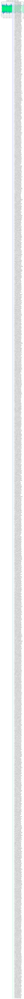

<Figure size 1440x1080 with 0 Axes>

In [21]:
# 5.1 Parallel coordinates with random data

fig1 = plt.figure()

pd.plotting.parallel_coordinates(nc_rand,
                                 'loss',    # class_column
                                  colormap='winter'
                                  )
plt.xticks(rotation=90)
plt.title("Parallel chart with random data")
plt.figure(figsize=(20,15))

Text(0.5, 1.0, 'Parallel chart with ad data')

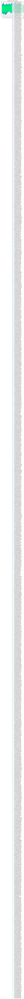

In [22]:
# 5.2 Parallel coordinates with 'ad' data
fig2 = plt.figure()
ax = pd.plotting.parallel_coordinates(nc,
                                 'loss',
                                  colormap= plt.cm.winter
                                  )

plt.xticks(rotation=90)
plt.title("Parallel chart with ad data")

# Andrews plot

Text(0.5, 1.0, 'Andrews plots with random data')

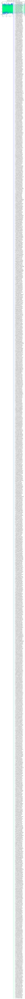

In [23]:
# 6.0 Andrews charts with random data
fig3 = plt.figure()
pd.plotting.andrews_curves(nc_rand,
                           'loss',
                           colormap = 'winter')

plt.title("Andrews plots with random data")

Text(0.5, 1.0, 'Andrews curve with ad data')

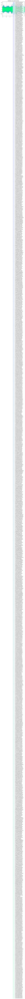

In [24]:
# 6.1 Andrews plots with ad data
fig4 = plt.figure()
pd.plotting.andrews_curves(nc,
                           'loss',
                            colormap = plt.cm.winter
                           )
plt.xticks(rotation=90)
plt.title("Andrews curve with ad data")

# Radviz plot

<AxesSubplot:>

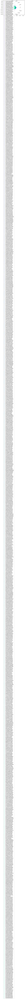

In [25]:
# 7.0 Radviz plot
# https://pandas.pydata.org/docs/reference/api/pandas.plotting.radviz.html

fig5 = plt.figure()
pd.plotting.radviz(nc,
                   class_column ='loss',
                   colormap= plt.cm.winter,
                   alpha = 0.4
                   )

# t-sne

In [26]:
# 8.0 See the power of t-sne
#      (t-distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE

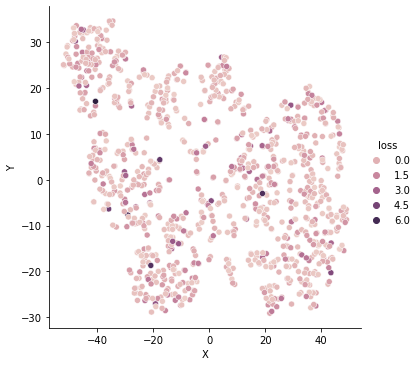

In [27]:
# 8.1 Project all data but 'Clicked_on_ad' on two axis
#        Also just replace nc with nc_rand and try again

X_embedded = TSNE(n_components=2).fit_transform(nc.iloc[:,:-1])
X_embedded.shape    # (1000,2), numpy array
df = pd.DataFrame(X_embedded, columns=['X','Y'])

# 11.5.2 No two plots will be the same
sns.relplot(x = "X",
            y = "Y",
            hue = nc.loss,    # Colur each point as per 1 or 0
            data = df
            )